# 📊 Exploratory Data Analysis (EDA) End-to-End
## Studi Kasus: E-Commerce Customer Churn

---

### 🎯 Tujuan Pembelajaran
- Memahami proses EDA dari awal hingga akhir
- Mengidentifikasi dan menangani masalah kualitas data
- Membuat visualisasi univariate, bivariate, dan multivariate
- Menghasilkan insight bisnis yang actionable

---

## 📋 Part 1: Memahami Masalah Bisnis

### Latar Belakang
Sebuah perusahaan e-commerce mengalami **penurunan retensi pelanggan**. Tim manajemen ingin memahami:

1. **Siapa** pelanggan yang cenderung churn (berhenti berlangganan)?
2. **Faktor apa** yang paling mempengaruhi churn?
3. **Strategi apa** yang bisa dilakukan untuk meningkatkan retensi?

### Pertanyaan Bisnis
- Bagaimana profil pelanggan yang churn vs tidak churn?
- Adakah hubungan antara tenure, frequency, dan churn?
- Bagaimana pengaruh metode pembayaran dan device terhadap churn?

### Definisi Churn
> **Churn** = Pelanggan yang tidak melakukan transaksi dalam 6 bulan terakhir

---
## 🔧 Part 2: Setup & Load Data

In [50]:
# Import library yang dibutuhkan
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

# Setting visualisasi
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12
warnings.filterwarnings('ignore')
%matplotlib inline

print("✅ Library berhasil diimport!")

✅ Library berhasil diimport!


In [51]:
# Membuat dataset E-Commerce Customer Churn
# Dataset ini mensimulasikan data pelanggan e-commerce yang realistis

np.random.seed(42)
n = 500  # Jumlah pelanggan

# Generate data
data = {
    'customer_id': [f'CUST_{i:04d}' for i in range(1, n+1)],
    'gender': np.random.choice(['Male', 'Female'], n),
    'age': np.random.randint(18, 65, n),
    'city_tier': np.random.choice(['Tier 1', 'Tier 2', 'Tier 3'], n, p=[0.4, 0.35, 0.25]),
    'tenure_months': np.random.randint(1, 72, n),
    'preferred_device': np.random.choice(['Mobile', 'Desktop', 'Tablet'], n, p=[0.6, 0.3, 0.1]),
    'preferred_payment': np.random.choice(['Credit Card', 'E-Wallet', 'Bank Transfer', 'COD'], n),
    'order_count': np.random.randint(1, 50, n),
    'avg_order_value': np.round(np.random.uniform(50000, 500000, n), -3),
    'total_spent': np.round(np.random.uniform(100000, 5000000, n), -3),
    'days_since_last_order': np.random.randint(1, 365, n),
    'complaint_count': np.random.choice([0, 1, 2, 3, 4, 5], n, p=[0.5, 0.25, 0.12, 0.07, 0.04, 0.02]),
    'satisfaction_score': np.random.choice([1, 2, 3, 4, 5], n, p=[0.05, 0.1, 0.25, 0.35, 0.25]),
    'coupon_usage': np.random.randint(0, 20, n),
    'app_usage_hours': np.round(np.random.uniform(0.5, 50, n), 1),
}

df = pd.DataFrame(data)

# Generate churn berdasarkan beberapa faktor (simulasi realistis)
churn_prob = (
    0.1 +
    (df['days_since_last_order'] > 180).astype(int) * 0.3 +
    (df['complaint_count'] >= 2).astype(int) * 0.2 +
    (df['satisfaction_score'] <= 2).astype(int) * 0.25 +
    (df['tenure_months'] < 6).astype(int) * 0.15 -
    (df['order_count'] > 20).astype(int) * 0.1
)
churn_prob = np.clip(churn_prob, 0, 1)
df['churn'] = np.random.binomial(1, churn_prob)

# Tambahkan missing values (realistis)
df.loc[np.random.choice(n, 25, replace=False), 'satisfaction_score'] = np.nan
df.loc[np.random.choice(n, 15, replace=False), 'avg_order_value'] = np.nan
df.loc[np.random.choice(n, 10, replace=False), 'app_usage_hours'] = np.nan

# Tambahkan inconsistent data
df.loc[0:3, 'gender'] = ['MALE', 'female', 'Male', 'FEMALE']
df.loc[5:7, 'preferred_device'] = ['mobile', 'DESKTOP', 'Mobile App']

print(f"✅ Dataset berhasil dibuat dengan {len(df)} baris dan {len(df.columns)} kolom")

✅ Dataset berhasil dibuat dengan 500 baris dan 16 kolom


In [52]:
df.head()

,customer_id,gender,age,city_tier,tenure_months,preferred_device,preferred_payment,order_count,avg_order_value,total_spent,days_since_last_order,complaint_count,satisfaction_score,coupon_usage,app_usage_hours,churn
0,CUST_0001,MALE,38,Tier 2,61,Desktop,Credit Card,49,224000.0,4209000.0,276,0,4.0,10,8.5,0
1,CUST_0002,female,49,Tier 1,35,Desktop,E-Wallet,42,335000.0,4045000.0,205,0,3.0,4,9.1,0
2,CUST_0003,Male,40,Tier 3,50,Desktop,Credit Card,43,367000.0,4133000.0,337,0,4.0,15,13.7,1
3,CUST_0004,FEMALE,50,Tier 1,62,Mobile,Credit Card,41,52000.0,4670000.0,273,0,1.0,6,6.4,0
4,CUST_0005,Male,20,Tier 1,17,Mobile,E-Wallet,9,125000.0,2767000.0,58,1,4.0,4,NaN,1


---
## 🔍 Part 3: Pemahaman Awal Data

**Checklist EDA:**
1. Berapa ukuran data? (`shape`)
2. Apa saja kolomnya? (`columns`)
3. Tipe data apa saja? (`info`)
4. Statistik deskriptif? (`describe`)
5. Ada missing values? (`isnull`)
6. Ada duplikat? (`duplicated`)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   customer_id            500 non-null    object 
 1   gender                 500 non-null    object 
 2   age                    500 non-null    int64  
 3   city_tier              500 non-null    object 
 4   tenure_months          500 non-null    int64  
 5   preferred_device       500 non-null    object 
 6   preferred_payment      500 non-null    object 
 7   order_count            500 non-null    int64  
 8   avg_order_value        485 non-null    float64
 9   total_spent            500 non-null    float64
 10  days_since_last_order  500 non-null    int64  
 11  complaint_count        500 non-null    int64  
 12  satisfaction_score     475 non-null    float64
 13  coupon_usage           500 non-null    int64  
 14  app_usage_hours        490 non-null    float64
 15  churn 

In [54]:
# 3.1 Ukuran dan preview data
print(f"📊 Ukuran Dataset: {df.shape[0]} baris × {df.shape[1]} kolom")
print("\n" + "="*60)
print("📋 Preview Data (5 baris pertama):")
df.head()

📊 Ukuran Dataset: 500 baris × 16 kolom

📋 Preview Data (5 baris pertama):


,customer_id,gender,age,city_tier,tenure_months,preferred_device,preferred_payment,order_count,avg_order_value,total_spent,days_since_last_order,complaint_count,satisfaction_score,coupon_usage,app_usage_hours,churn
0,CUST_0001,MALE,38,Tier 2,61,Desktop,Credit Card,49,224000.0,4209000.0,276,0,4.0,10,8.5,0
1,CUST_0002,female,49,Tier 1,35,Desktop,E-Wallet,42,335000.0,4045000.0,205,0,3.0,4,9.1,0
2,CUST_0003,Male,40,Tier 3,50,Desktop,Credit Card,43,367000.0,4133000.0,337,0,4.0,15,13.7,1
3,CUST_0004,FEMALE,50,Tier 1,62,Mobile,Credit Card,41,52000.0,4670000.0,273,0,1.0,6,6.4,0
4,CUST_0005,Male,20,Tier 1,17,Mobile,E-Wallet,9,125000.0,2767000.0,58,1,4.0,4,NaN,1


In [55]:
# 3.2 Informasi tipe data
print("📋 Informasi Tipe Data:")
print("="*60)
df.info()

📋 Informasi Tipe Data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   customer_id            500 non-null    object 
 1   gender                 500 non-null    object 
 2   age                    500 non-null    int64  
 3   city_tier              500 non-null    object 
 4   tenure_months          500 non-null    int64  
 5   preferred_device       500 non-null    object 
 6   preferred_payment      500 non-null    object 
 7   order_count            500 non-null    int64  
 8   avg_order_value        485 non-null    float64
 9   total_spent            500 non-null    float64
 10  days_since_last_order  500 non-null    int64  
 11  complaint_count        500 non-null    int64  
 12  satisfaction_score     475 non-null    float64
 13  coupon_usage           500 non-null    int64  
 14  app_usage_hours        490 non-null

In [56]:
# 3.3 Statistik deskriptif untuk kolom numerik
print("📊 Statistik Deskriptif (Numerik):")
df.describe().round(2)

📊 Statistik Deskriptif (Numerik):


,age,tenure_months,order_count,avg_order_value,total_spent,days_since_last_order,complaint_count,satisfaction_score,coupon_usage,app_usage_hours,churn
count,500.00,500.00,500.00,485.00,500.00,500.00,500.00,475.00,500.00,490.00,500.00
mean,40.73,35.44,25.63,274927.84,2547366.00,187.20,0.90,3.67,9.55,24.54,0.28
std,13.28,20.33,14.28,132460.76,1390316.91,101.39,1.22,1.10,5.66,14.49,0.45
min,18.00,1.00,1.00,50000.00,103000.00,1.00,0.00,1.00,0.00,0.50,0.00
25%,29.00,18.00,13.00,164000.00,1290750.00,103.00,0.00,3.00,5.00,11.62,0.00
50%,41.00,35.50,26.00,274000.00,2581500.00,190.50,0.00,4.00,9.00,24.40,0.00
75%,52.00,52.00,38.00,387000.00,3777250.00,271.25,1.00,5.00,15.00,36.88,1.00
max,64.00,71.00,49.00,498000.00,4995000.00,364.00,5.00,5.00,19.00,50.00,1.00


In [57]:
# 3.4 Statistik deskriptif untuk kolom kategorikal
print("📊 Statistik Deskriptif (Kategorikal):")
df.describe(include='object')

📊 Statistik Deskriptif (Kategorikal):


,customer_id,gender,city_tier,preferred_device,preferred_payment
count,500,500,500,500,500
unique,500,5,3,6,4
top,CUST_0500,Female,Tier 2,Mobile,COD
freq,1,255,196,296,142


In [58]:
df.describe(include='object')

,customer_id,gender,city_tier,preferred_device,preferred_payment
count,500,500,500,500,500
unique,500,5,3,6,4
top,CUST_0500,Female,Tier 2,Mobile,COD
freq,1,255,196,296,142


In [59]:
df.isnull().sum()

,0
customer_id,0
gender,0
age,0
city_tier,0
tenure_months,0
preferred_device,0
preferred_payment,0
order_count,0
avg_order_value,15
total_spent,0


In [60]:
# 3.5 Cek missing values
print("❓ Missing Values:")
print("="*60)
missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
missing_df = pd.DataFrame({'Missing Count': missing, 'Missing %': missing_pct})
print(missing_df[missing_df['Missing Count'] > 0])

❓ Missing Values:
                    Missing Count  Missing %
avg_order_value                15        3.0
satisfaction_score             25        5.0
app_usage_hours                10        2.0


In [61]:
# 3.6 Cek duplikat
print(f"🔄 Jumlah baris duplikat: {df.duplicated().sum()}")

🔄 Jumlah baris duplikat: 0


### 📝 Temuan Awal:
1. Dataset memiliki **500 pelanggan** dengan **16 fitur**
2. Terdapat **missing values** pada: satisfaction_score, avg_order_value, app_usage_hours
3. Perlu **standardisasi** untuk kolom gender dan preferred_device

---
## 🧹 Part 4: Data Cleaning

In [62]:
# df['avg_order_value'].value_counts()

In [63]:
df['gender'].value_counts()

,count
gender,
Female,255
Male,242
MALE,1
female,1
FEMALE,1


In [64]:
df['gender'].unique()

array(['MALE', 'female', 'Male', 'FEMALE', 'Female'], dtype=object)

In [65]:
# 4.1 Standardisasi kolom gender
print("Sebelum standardisasi:")
print(df['gender'].unique())

df['gender'] = df['gender'].str.title()  # Kapital di huruf pertama

print("\nSetelah standardisasi:")
print(df['gender'].unique())

Sebelum standardisasi:
['MALE' 'female' 'Male' 'FEMALE' 'Female']

Setelah standardisasi:
['Male' 'Female']


In [66]:
df['gender'].value_counts()

,count
gender,
Female,257
Male,243


In [67]:
df['preferred_device'].value_counts()

,count
preferred_device,
Mobile,296
Desktop,156
Tablet,45
mobile,1
DESKTOP,1
Mobile App,1


In [68]:
df['preferred_device'].unique()

array(['Desktop', 'Mobile', 'mobile', 'DESKTOP', 'Mobile App', 'Tablet'],
      dtype=object)

In [69]:
device_mapping = {
    'mobile': 'Mobile',
    'DESKTOP': 'Desktop',
    'Mobile App': 'Mobile'
}
print(type(device_mapping))
device_mapping

<class 'dict'>


{'mobile': 'Mobile', 'DESKTOP': 'Desktop', 'Mobile App': 'Mobile'}

In [70]:
df['preferred_device'] = df['preferred_device'].replace(device_mapping)

In [71]:
df['preferred_device'].unique()

array(['Desktop', 'Mobile', 'Tablet'], dtype=object)

In [72]:
df['preferred_device'].value_counts()

,count
preferred_device,
Mobile,298
Desktop,157
Tablet,45


In [73]:
# 4.2 Standardisasi kolom preferred_device
print("Sebelum standardisasi:")
print(df['preferred_device'].unique())

# Perbaiki nilai yang tidak konsisten
device_mapping = {
    'mobile': 'Mobile',
    'DESKTOP': 'Desktop',
    'Mobile App': 'Mobile'
}
df['preferred_device'] = df['preferred_device'].replace(device_mapping)

print("\nSetelah standardisasi:")
print(df['preferred_device'].unique())

Sebelum standardisasi:
['Desktop' 'Mobile' 'Tablet']

Setelah standardisasi:
['Desktop' 'Mobile' 'Tablet']


In [74]:
# data numerik
# dibuang, 0, median, mean, mode

In [75]:
# 4.3 Handling missing values
print("Missing values sebelum handling:")
print(df.isnull().sum()[df.isnull().sum() > 0])

# Isi dengan median untuk numerik
# fillna -> isi yang kosongn dengan 0
df['satisfaction_score'] = df['satisfaction_score'].fillna(0)

# fillna -> isi yang kosong pada avg_order_value dengan median dari avg_order_value
df['avg_order_value'] = df['avg_order_value'].fillna(df['avg_order_value'].median())

# fillna -> isi yang kosong pada app_usage_hours dengan median dari app_usage_hours
df['app_usage_hours'] = df['app_usage_hours'].fillna(df['app_usage_hours'].median())

Missing values sebelum handling:
avg_order_value       15
satisfaction_score    25
app_usage_hours       10
dtype: int64


In [76]:
df.isnull().sum()

,0
customer_id,0
gender,0
age,0
city_tier,0
tenure_months,0
preferred_device,0
preferred_payment,0
order_count,0
avg_order_value,0
total_spent,0


In [77]:
df['churn'].value_counts()

,count
churn,
0,359
1,141


In [78]:
# 4.4 Buat kolom churn_label untuk visualisasi
df['churn_label'] = df['churn'].map({0: 'Tidak Churn', 1: 'Churn'})

df['churn_label'].value_counts()

,count
churn_label,
Tidak Churn,359
Churn,141


---
## 📈 Part 5: Univariate Analysis

**Univariate** = Menganalisis **SATU** variabel pada satu waktu

In [79]:
df['churn_label'].value_counts(normalize=True)*100

,proportion
churn_label,
Tidak Churn,71.8
Churn,28.2


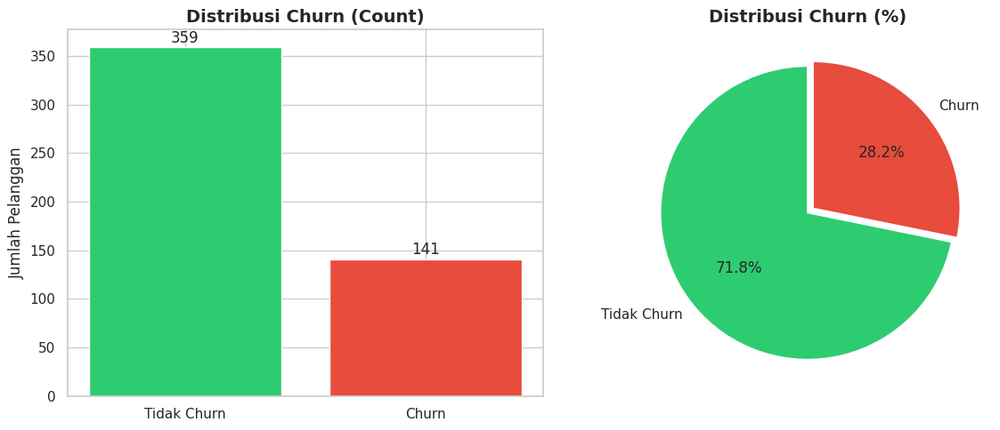

💡 Insight: 28.2% pelanggan mengalami churn


In [80]:
# 5.1 Distribusi Target Variable: Churn
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Bar chart
churn_counts = df['churn_label'].value_counts()
colors = ['#2ecc71', '#e74c3c']
axes[0].bar(churn_counts.index, churn_counts.values, color=colors)
axes[0].set_title('Distribusi Churn (Count)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Jumlah Pelanggan')
for i, v in enumerate(churn_counts.values):
    axes[0].text(i, v + 5, str(v), ha='center', fontsize=12)

# Pie chart
axes[1].pie(churn_counts.values, labels=churn_counts.index, autopct='%1.1f%%',
            colors=colors, explode=[0, 0.05], startangle=90)
axes[1].set_title('Distribusi Churn (%)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print(f"💡 Insight: {churn_counts.values[1]/len(df)*100:.1f}% pelanggan mengalami churn")

In [81]:
# 5.2 Distribusi Variabel Numerik
num_cols = ['age', 'tenure_months', 'order_count', 'total_spent', 'days_since_last_order', 'satisfaction_score']
num_cols

['age',
 'tenure_months',
 'order_count',
 'total_spent',
 'days_since_last_order',
 'satisfaction_score']

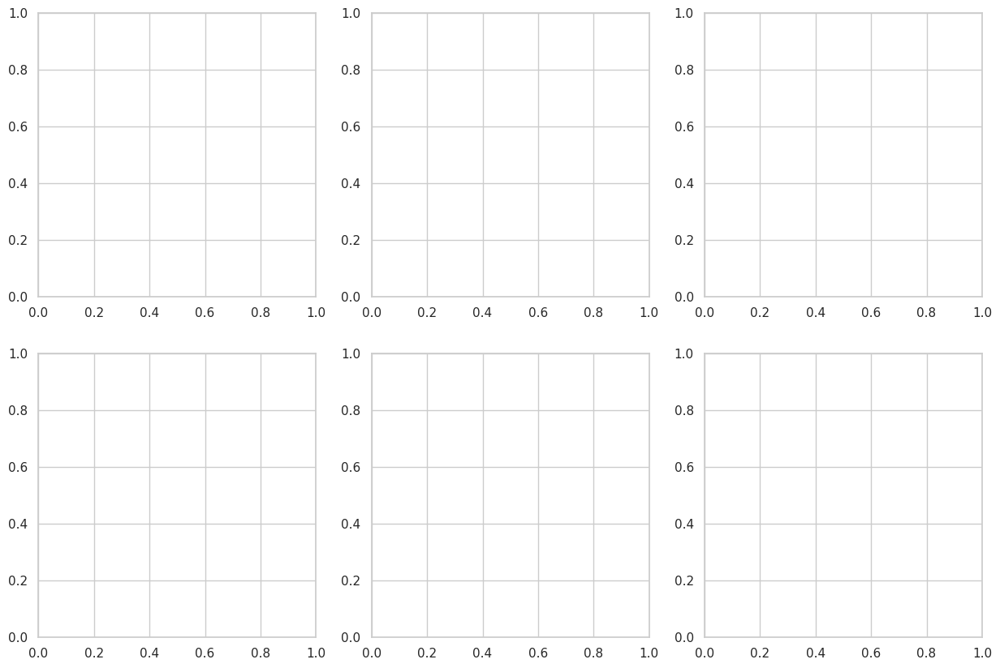

In [82]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

In [83]:
for i, col in enumerate(num_cols):
  print(i,' - ', col)

0  -  age
1  -  tenure_months
2  -  order_count
3  -  total_spent
4  -  days_since_last_order
5  -  satisfaction_score


In [84]:
df[['order_count']].describe(percentiles=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])

,order_count
count,500.000000
mean,25.630000
std,14.284719
min,1.000000
10%,5.000000
20%,11.000000
30%,16.000000
40%,21.000000
50%,26.000000
60%,31.000000


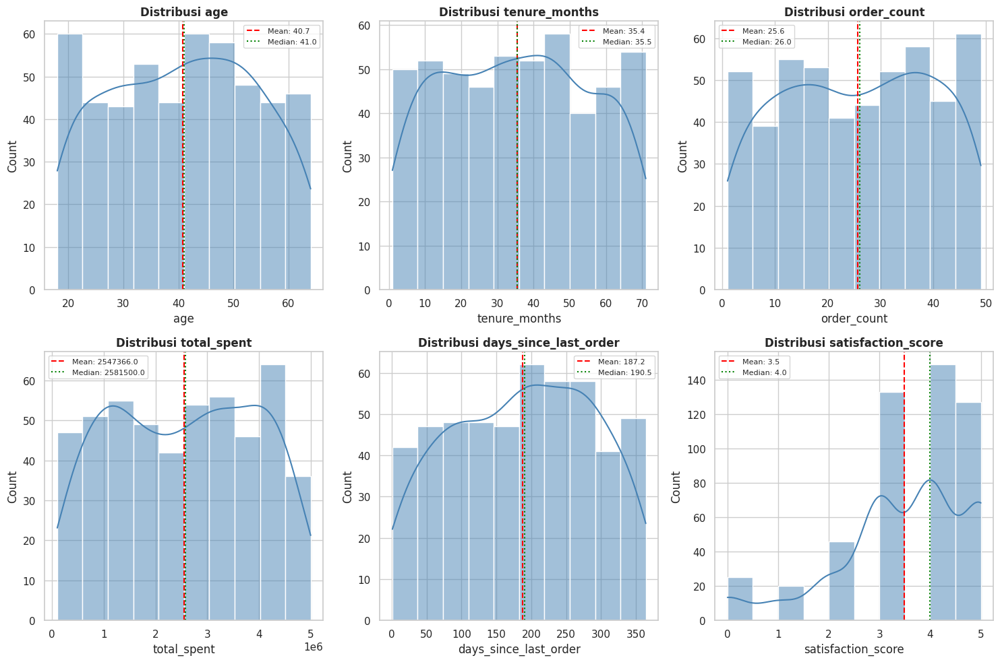

In [85]:
# 5.2 Distribusi Variabel Numerik
num_cols = ['age', 'tenure_months', 'order_count', 'total_spent', 'days_since_last_order', 'satisfaction_score']

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(df[col], kde=True, ax=axes[i], color='steelblue')
    axes[i].set_title(f'Distribusi {col}', fontsize=12, fontweight='bold')
    axes[i].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.1f}')
    axes[i].axvline(df[col].median(), color='green', linestyle=':', label=f'Median: {df[col].median():.1f}')
    axes[i].legend(fontsize=8)

plt.tight_layout()
plt.show()

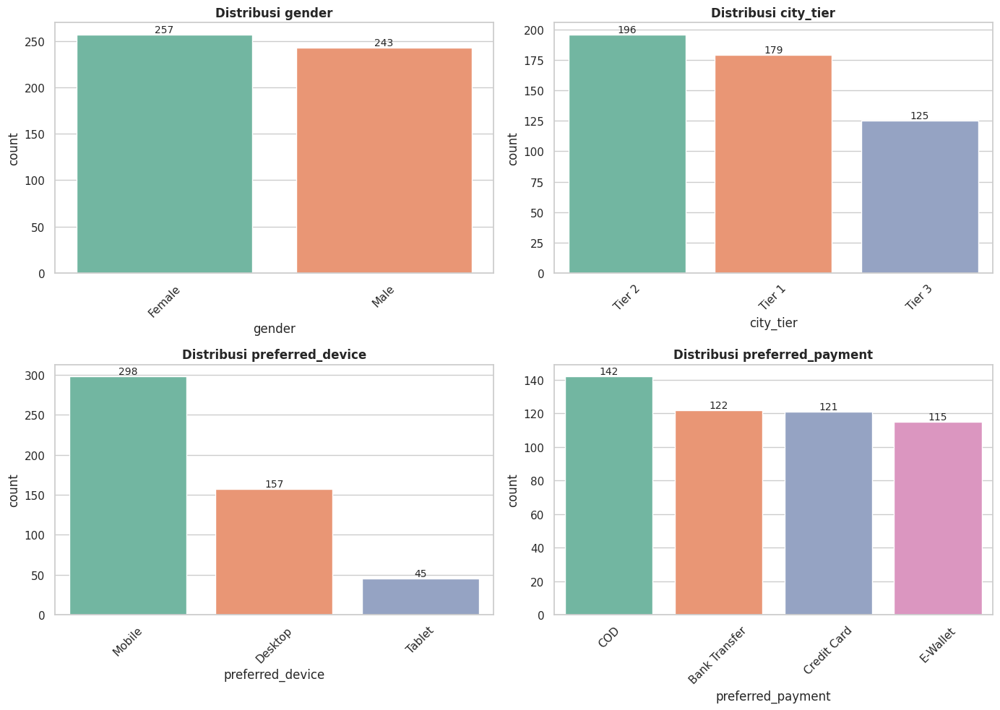

In [86]:
# 5.3 Distribusi Variabel Kategorikal
cat_cols = ['gender', 'city_tier', 'preferred_device', 'preferred_payment']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    order = df[col].value_counts().index
    sns.countplot(data=df, x=col, order=order, ax=axes[i], palette='Set2')
    axes[i].set_title(f'Distribusi {col}', fontsize=12, fontweight='bold')
    axes[i].tick_params(axis='x', rotation=45)

    # Tambahkan nilai di atas bar
    for p in axes[i].patches:
        axes[i].annotate(f'{int(p.get_height())}',
                        (p.get_x() + p.get_width()/2., p.get_height()),
                        ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

---
## 🔀 Part 6: Bivariate Analysis

**Bivariate** = Menganalisis hubungan antara **DUA** variabel

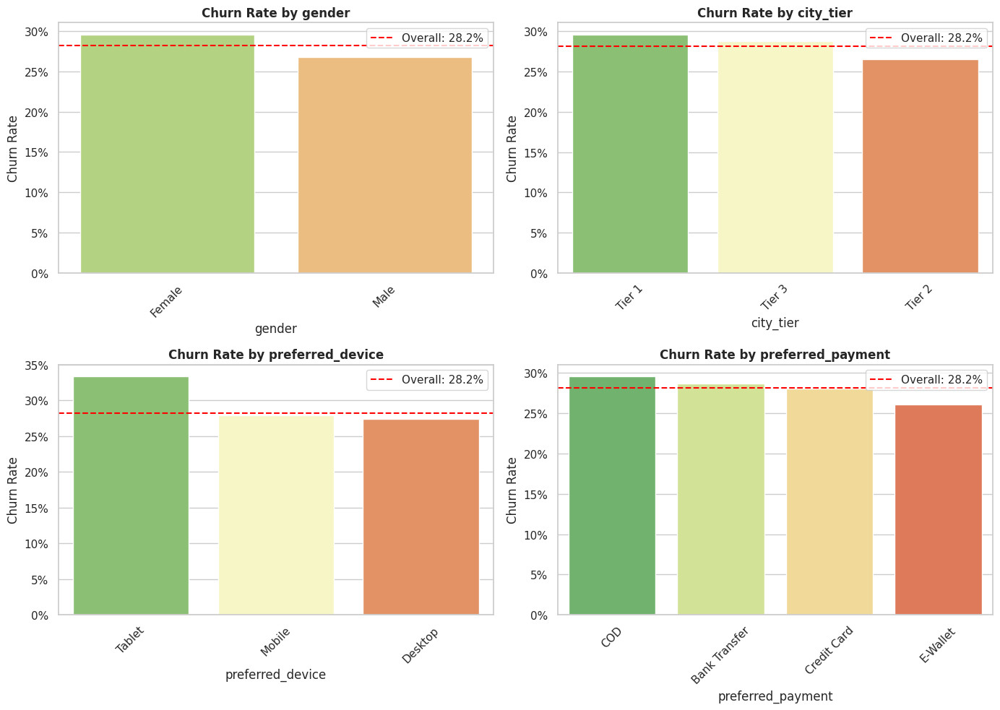

In [87]:
# 6.1 Churn Rate by Kategorikal
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    churn_rate = df.groupby(col)['churn'].mean().sort_values(ascending=False)
    sns.barplot(x=churn_rate.index, y=churn_rate.values, ax=axes[i], palette='RdYlGn_r')
    axes[i].set_title(f'Churn Rate by {col}', fontsize=12, fontweight='bold')
    axes[i].set_ylabel('Churn Rate')
    axes[i].axhline(df['churn'].mean(), color='red', linestyle='--', label=f'Overall: {df["churn"].mean():.1%}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)

    # Format y-axis as percentage
    axes[i].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0%}'))

plt.tight_layout()
plt.show()

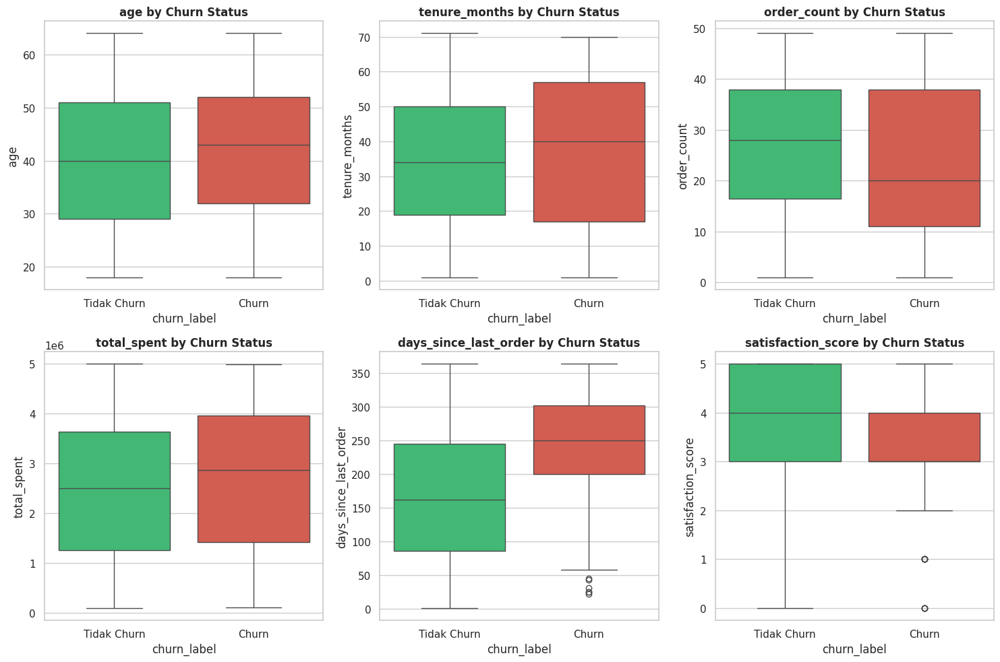

In [88]:
# 6.2 Box Plot: Numerik vs Churn
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.boxplot(data=df, x='churn_label', y=col, ax=axes[i], palette=['#2ecc71', '#e74c3c'])
    axes[i].set_title(f'{col} by Churn Status', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

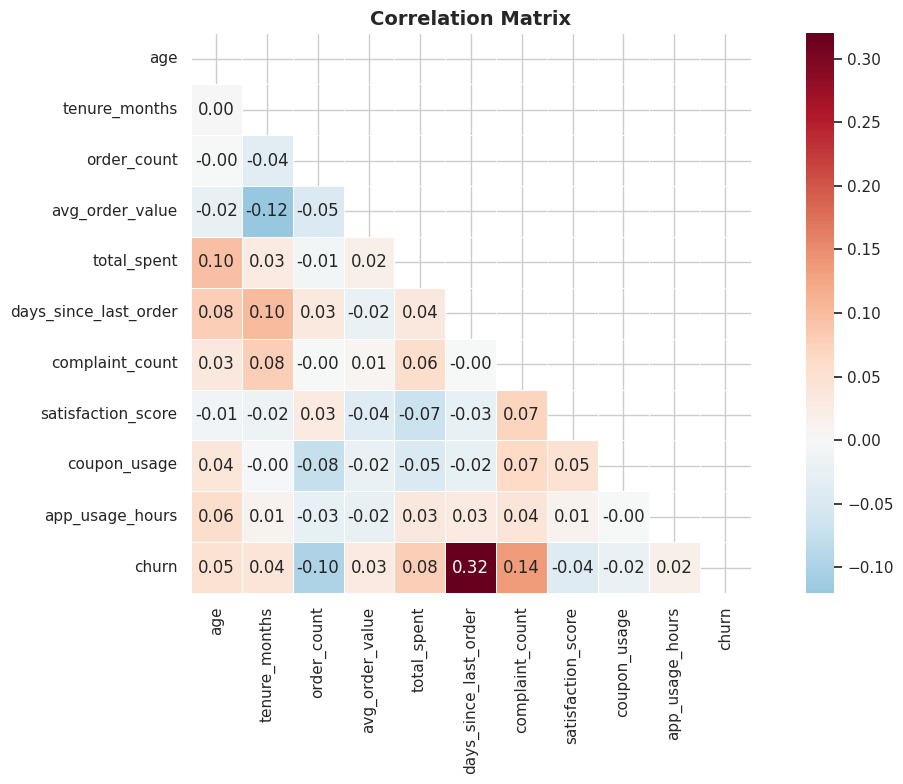

📊 Korelasi dengan Churn (Top 5):
days_since_last_order    0.320103
complaint_count          0.137594
order_count             -0.098681
total_spent              0.079079
age                      0.048258
Name: churn, dtype: float64


In [89]:
# 6.3 Correlation Heatmap
plt.figure(figsize=(12, 8))
corr_cols = ['age', 'tenure_months', 'order_count', 'avg_order_value', 'total_spent',
             'days_since_last_order', 'complaint_count', 'satisfaction_score', 'coupon_usage',
             'app_usage_hours', 'churn']
corr_matrix = df[corr_cols].corr()

# Mask untuk upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='RdBu_r', center=0,
            fmt='.2f', square=True, linewidths=0.5)
plt.title('Correlation Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Korelasi dengan Churn
print("📊 Korelasi dengan Churn (Top 5):")
print(corr_matrix['churn'].drop('churn').sort_values(key=abs, ascending=False).head())

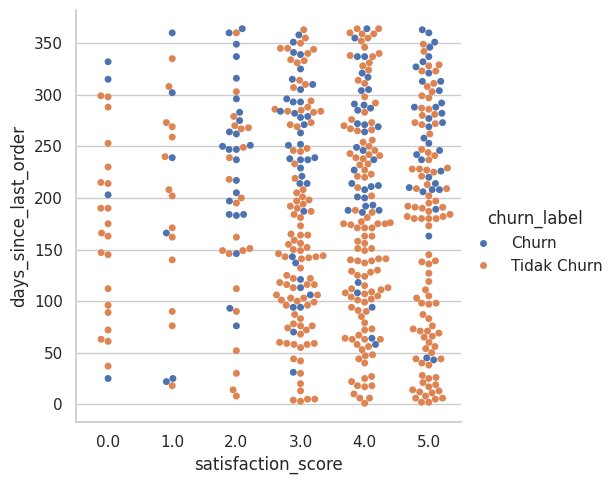

In [90]:
# sns.countplot(data=df, x='days_since_last_order', y='satisfaction_score', hue='churn_label')
sns.catplot(x="satisfaction_score", y="days_since_last_order",hue= 'churn_label',kind="swarm",data=df)

In [91]:
# # 6.4 Scatter Plot: Days Since Last Order vs Satisfaction Score
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=df, x='days_since_last_order', y='satisfaction_score',
#                 hue='churn_label', palette=['#2ecc71', '#e74c3c'], alpha=0.6)
# plt.title('Days Since Last Order vs Satisfaction Score', fontsize=14, fontweight='bold')
# plt.xlabel('Days Since Last Order')
# plt.ylabel('Satisfaction Score')
# plt.legend(title='Status')
# plt.show()

---
## 🔄 Part 7: Multivariate Analysis

**Multivariate** = Menganalisis hubungan antara **TIGA atau lebih** variabel

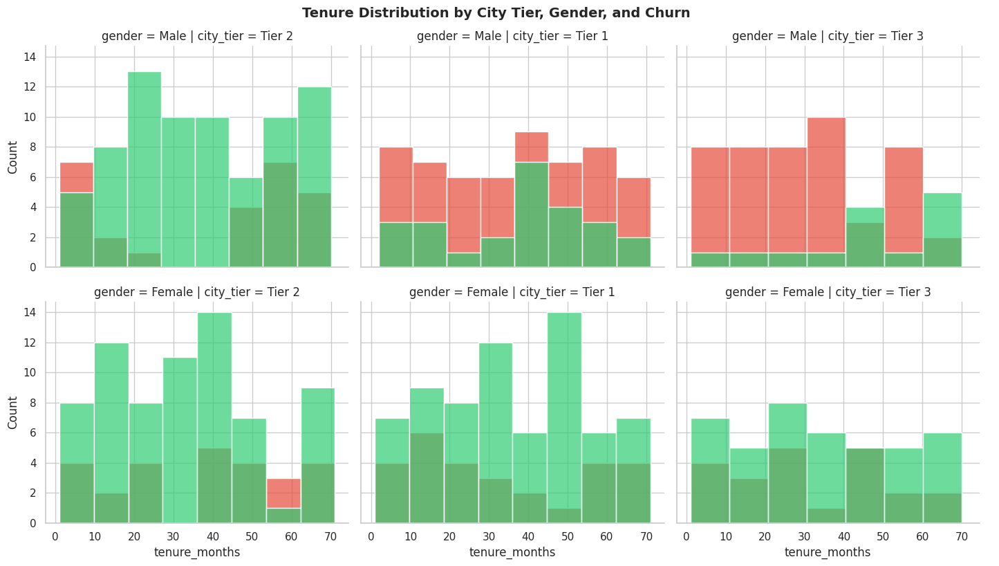

In [92]:
# 7.1 FacetGrid: Churn by City Tier and Gender
g = sns.FacetGrid(df, col='city_tier', row='gender', height=4, aspect=1.2)
g.map_dataframe(sns.histplot, x='tenure_months', hue='churn_label',
                palette=['#2ecc71', '#e74c3c'], alpha=0.7)
g.add_legend()
g.fig.suptitle('Tenure Distribution by City Tier, Gender, and Churn', y=1.02, fontsize=14, fontweight='bold')
plt.show()

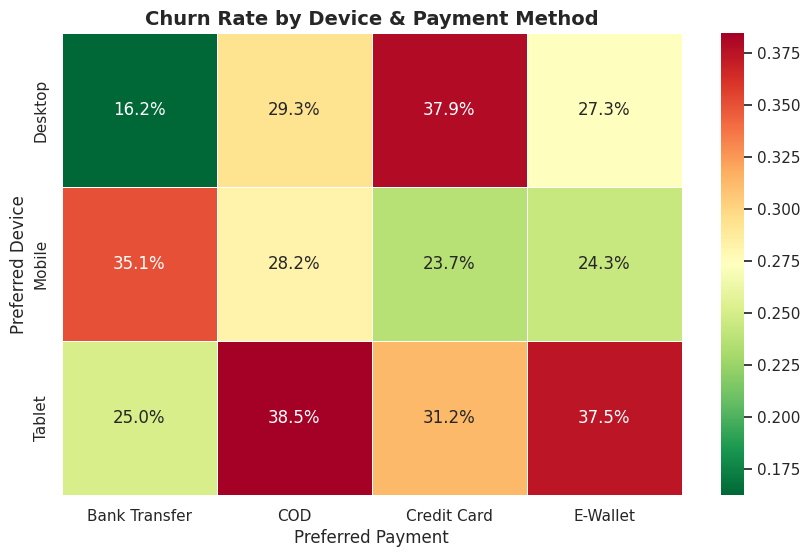

In [93]:
# 7.2 Pivot Table: Churn Rate by Device and Payment
pivot = df.pivot_table(values='churn', index='preferred_device',
                       columns='preferred_payment', aggfunc='mean')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot, annot=True, cmap='RdYlGn_r', fmt='.1%', linewidths=0.5)
plt.title('Churn Rate by Device & Payment Method', fontsize=14, fontweight='bold')
plt.ylabel('Preferred Device')
plt.xlabel('Preferred Payment')
plt.show()

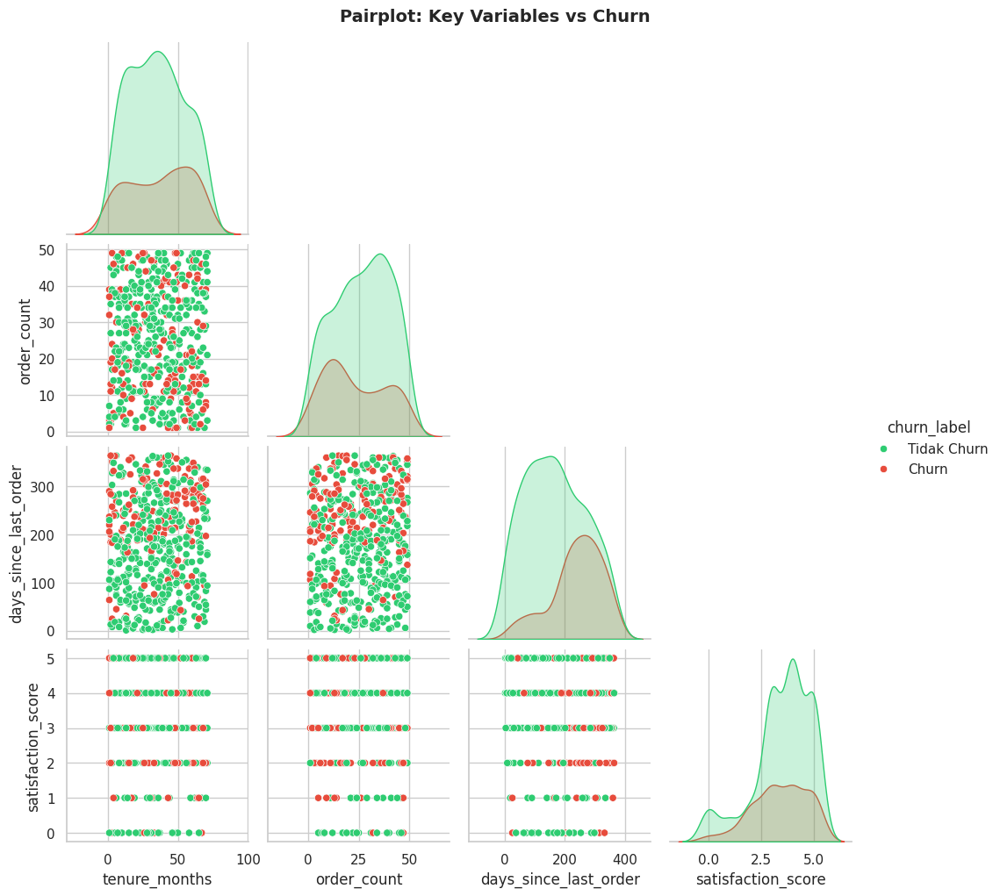

In [94]:
# 7.3 Pairplot untuk variabel kunci
key_cols = ['tenure_months', 'order_count', 'days_since_last_order', 'satisfaction_score', 'churn_label']
g = sns.pairplot(df[key_cols], hue='churn_label', palette=['#2ecc71', '#e74c3c'],
                 diag_kind='kde', corner=True)
g.fig.suptitle('Pairplot: Key Variables vs Churn', y=1.02, fontsize=14, fontweight='bold')
plt.show()

---
## 💡 Part 8: Insight & Rekomendasi Bisnis

### 📊 Ringkasan Temuan

| Faktor | Insight | Rekomendasi |
|--------|---------|-------------|
| **Days Since Last Order** | Pelanggan dengan >180 hari tanpa order cenderung churn | Buat program re-engagement untuk pelanggan yang tidak aktif >90 hari |
| **Complaint Count** | Pelanggan dengan ≥2 komplain punya churn rate lebih tinggi | Tingkatkan SLA dan follow-up untuk pelanggan dengan komplain |
| **Satisfaction Score** | Score ≤2 berkorelasi kuat dengan churn | Prioritaskan improvement untuk pelanggan dengan satisfaction rendah |
| **Tenure** | Pelanggan baru (<6 bulan) lebih rentan churn | Buat onboarding program dan early retention campaign |

### 🎯 Rekomendasi Aksi

1. **Early Warning System**: Buat sistem alert untuk pelanggan dengan indikator risiko churn
2. **Loyalty Program**: Reward untuk pelanggan dengan tenure tinggi dan order count tinggi
3. **Customer Success Team**: Fokus pada pelanggan dengan satisfaction score rendah
4. **Re-activation Campaign**: Kirim promo khusus untuk pelanggan yang tidak aktif >60 hari

In [95]:
# Summary Statistics
print("="*60)
print("📊 RINGKASAN EDA E-COMMERCE CUSTOMER CHURN")
print("="*60)
print(f"\n📌 Total Pelanggan: {len(df):,}")
print(f"📌 Churn Rate: {df['churn'].mean():.1%}")
print(f"📌 Avg Tenure: {df['tenure_months'].mean():.1f} bulan")
print(f"📌 Avg Order Count: {df['order_count'].mean():.1f} orders")
print(f"📌 Avg Total Spent: Rp {df['total_spent'].mean():,.0f}")
print(f"\n🔴 High Risk Segment (churn rate tertinggi):")
print(f"   - Days since last order > 180: {df[df['days_since_last_order']>180]['churn'].mean():.1%}")
print(f"   - Satisfaction score ≤ 2: {df[df['satisfaction_score']<=2]['churn'].mean():.1%}")
print(f"   - Complaint ≥ 2: {df[df['complaint_count']>=2]['churn'].mean():.1%}")

📊 RINGKASAN EDA E-COMMERCE CUSTOMER CHURN

📌 Total Pelanggan: 500
📌 Churn Rate: 28.2%
📌 Avg Tenure: 35.4 bulan
📌 Avg Order Count: 25.6 orders
📌 Avg Total Spent: Rp 2,547,366

🔴 High Risk Segment (churn rate tertinggi):
   - Days since last order > 180: 43.0%
   - Satisfaction score ≤ 2: 37.4%
   - Complaint ≥ 2: 41.0%


---
## ✅ Selesai!

Notebook ini mendemonstrasikan proses **EDA end-to-end** dengan langkah:
1. ✅ Memahami masalah bisnis
2. ✅ Load dan eksplorasi data awal
3. ✅ Data cleaning
4. ✅ Univariate analysis
5. ✅ Bivariate analysis
6. ✅ Multivariate analysis
7. ✅ Insight dan rekomendasi bisnis

### 📚 Next Steps
- Coba notebook **`eda_automated_pipeline.ipynb`** untuk melihat cara menggunakan automated EDA tools!
- Gunakan insight ini untuk membangun **model prediksi churn**

---
## 📊 Bonus: YData Profiling

**YData Profiling** (sebelumnya pandas-profiling) adalah tool paling lengkap untuk automated EDA.

### Fitur Utama:
- ✅ Overview dataset
- ✅ Analisis per variabel
- ✅ Korelasi
- ✅ Missing values
- ✅ Duplikasi
- ✅ **Alerts** untuk masalah data!

Installing Ydata Profiling

In [96]:
!pip install ydata-profiling -q

In [97]:
# Import YData Profiling
from ydata_profiling import ProfileReport

# Generate report
# 💡 Tips: Gunakan minimal=True untuk dataset besar agar lebih cepat
profile = ProfileReport(
    df,
    title="E-Commerce Customer Churn - EDA Report",
    explorative=True,
)

print("✅ Report berhasil dibuat!")

✅ Report berhasil dibuat!


In [98]:
# Tampilkan report di notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 81.48it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]